In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import numpy as np
import torchvision.transforms as transforms
from torchvision.utils import make_grid
from torch.utils.data import DataLoader
from torchvision import datasets
from torch.autograd import Variable

import torch.nn as nn
import torch.nn.functional as F
import torch

In [3]:
!cat /proc/cpuinfo | grep processor

processor	: 0
processor	: 1
processor	: 2
processor	: 3


In [4]:
n_cpu = 4 # number of cpu threads to use during batch generation

In [5]:
dataset_name = "Monet-to-Photo"
root = "/content/drive/MyDrive/CV Data/"

img_height = 256
img_width = 256
channels = 3

epoch =0
n_epochs = 5
batch_size = 1
lr = 0.0002
b1 = 0.5
b2 = 0.999
decay_epoch = 3

#Generator

In [6]:
class ResidualBlock(nn.Module):
  def __init__(self, in_features):
    super(ResidualBlock, self).__init__()

    self.block = nn.Sequential(
        nn.ReflectionPad2d(1),
        nn.Conv2d(in_features, in_features,3),
        nn.InstanceNorm2d(in_features),
        nn.ReLU(inplace=True),
        nn.ReflectionPad2d(1),
        nn.Conv2d(in_features, in_features, 3),
        nn.InstanceNorm2d(in_features)

    )

  def forward(self, x):
    return x + self.block(x)


In [7]:
class GeneratorResNet(nn.Module):
  def __init__(self, input_shape, num_residual_block):
    super(GeneratorResNet, self).__init__()

    channels = input_shape[0]
    out_features = 64
    model = [
        nn.ReflectionPad2d(channels),
        nn.Conv2d(channels, out_features, 7),
        nn.InstanceNorm2d(out_features),
        nn.ReLU(inplace=True)
    ]
    in_features = out_features

    for _ in range(2):
      out_features *= 2
      model += [
          nn.Conv2d(in_features, out_features, 3, stride=2, padding=1),
          nn.InstanceNorm2d(out_features),
          nn.ReLU(inplace=True)
      ]
      in_features = out_features

    for _ in range(num_residual_block):
      model += [ResidualBlock(out_features)]

    for _ in range(2):
      out_features //=2
      model += [
          nn.Upsample(scale_factor=2),
          nn.Conv2d(in_features, out_features, 3, stride=1, padding=1),
          nn.ReLU(inplace=True)
      ]
      in_features = out_features

    model += [
        nn.ReflectionPad2d(channels),
        nn.Conv2d(out_features, channels, 7),
        nn.Tanh()
        ]

    self.model = nn.Sequential(*model)

  def forward(self,x):
    return self.model(x)

# Discriminator

In [8]:
class Discriminator(nn.Module):
  def __init__(self, input_shape):
    super(Discriminator, self).__init__()

    channels, height, width = input_shape

    self.output_shape = (1, height//2**4, width//2**4)

    def discriminator_block(in_filters, out_filters, normalize=True):
      layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
      if normalize:
        layers.append(nn.InstanceNorm2d(out_filters))

      layers.append(nn.LeakyReLU(0.2, inplace=True))
      return layers

    self.model = nn.Sequential(
        *discriminator_block(channels, 64, normalize=False),
        *discriminator_block(64, 128),
        *discriminator_block(128,256),
        *discriminator_block(256,512),
        nn.ZeroPad2d((1,0,1,0)),
        nn.Conv2d(512, 1, 4, padding=1)
    )

  def forward(self, img):
    return self.model(img)

In [9]:
criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()
criterion_identity = torch.nn.L1Loss()

In [10]:
input_shape = (channels, img_height, img_width)
n_residual_blocks = 9

G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)

D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)

In [11]:
cuda = torch.cuda.is_available()

if cuda:
  G_AB = G_AB.cuda()
  G_BA = G_BA.cuda()
  D_A = D_A.cuda()
  D_B = D_B.cuda()

  criterion_GAN.cuda()
  criterion_cycle.cuda()
  criterion_identity.cuda()

In [12]:
def weights_init_normal(m):
  classname = m.__class__.__name__
  if classname.find('Conv') != -1:
    torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
    if hasattr(m, 'bias') and m.bias is not None:
      torch.nn.init.constant_(m.bias.data, 0.0)

    elif classname.find('BatchNorm2d') != -1:
      torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
      torch.nn.init.constant_(m.bias.data, 0.0)

In [13]:
G_AB.apply(weights_init_normal)
G_BA.apply(weights_init_normal)
D_A.apply(weights_init_normal)
D_B.apply(weights_init_normal)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): ZeroPad2d((1, 0, 1, 0))
    (12): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  )
)

In [14]:
import itertools

optimizer_G = torch.optim.Adam(
    itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=lr, betas=(b1,b2)
)

optimizer_D_A = torch.optim.Adam(D_A.parameters(),lr=lr, betas=(b1,b2))
optimizer_D_B = torch.optim.Adam(D_B.parameters(),lr=lr, betas=(b1,b2))

In [15]:
class LambdaLR:
  def __init__(self, n_epochs, offset, decay_start_epoch):
    assert (n_epochs - decay_start_epoch) > 0, "Decay must start before the training session ends"
    self.n_epochs = n_epochs
    self.offset = offset
    self.decay_start_epoch = decay_start_epoch

  def step(self, epoch):
    return 1.0 - max(0, epoch+self.offset - self.decay_start_epoch)/(self.n_epochs - self.decay_start_epoch)

In [16]:
lr_scheduler_G = torch.optim.lr_scheduler.LambdaLR(
    optimizer_G, lr_lambda=LambdaLR(n_epochs, epoch, decay_epoch).step
)

lr_scheduler_D_A = torch.optim.lr_scheduler.LambdaLR(
    optimizer_D_A, lr_lambda=LambdaLR(n_epochs, epoch, decay_epoch).step
)

lr_scheduler_D_B = torch.optim.lr_scheduler.LambdaLR(
    optimizer_D_B, lr_lambda=LambdaLR(n_epochs, epoch, decay_epoch).step
)

In [17]:
from PIL import Image
import torchvision.transforms as transforms

transforms_ = [
    transforms.Resize(int(img_height*1.12), Image.BICUBIC),
    transforms.RandomCrop((img_height, img_width)),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
]

In [18]:
def to_rgb(image):
  rgb_image = Image.new("RGB", image.size)
  rgb_image.paste(image)
  return rgb_image

In [19]:
import os
import glob


In [20]:
print(root+dataset_name+'/monet_jpg')

/content/drive/MyDrive/CV Data/Monet-to-Photo/monet_jpg


In [21]:
len(glob.glob(os.path.join(root+dataset_name+'/monet_jpg'+'/*.*')))

300

In [23]:
len(glob.glob(os.path.join(root+dataset_name+'/photo_jpg'+'/*.*')))

7057

In [24]:
from torch.utils.data import Dataset

class ImageDataset(Dataset):

  def __init__(self, root, transforms_=None, unaligned=False, mode='train'):
    self.transforms = transforms.Compose(transforms_)
    self.unaligned = unaligned
    self.mode = mode
    if self.mode == 'train':
      self.files_A = sorted(glob.glob(os.path.join(root+'/monet_jpg'+'/*.*'))[:250])
      self.files_B = sorted(glob.glob(os.path.join(root+'/photo_jpg'+'/*.*'))[:250])
    elif self.mode == 'test':
      self.files_A = sorted(glob.glob(os.path.join(root+'/monet_jpg'+'/*.*'))[250:])
      self.files_B = sorted(glob.glob(os.path.join(root+'/photo_jpg'+'/*.*'))[250:301])

  def __getitem__(self, index):
    image_A = Image.open(self.files_A[index % len(self.files_A)])
    if self.unaligned:
      image_B = Image.open(self.files_B[np.random.randint(0, len(self.files_B)-1)])
    else:
      image_B = Image.open(self.files_B[index % len(self.files_B)])

    if image_A.mode != "RGB":
      image_A = to_rgb(image_A)

    if image_B.mode != "RGB":
      image_A = to_rgb(image_B)

    item_A = self.transforms(image_A)
    item_B = self.transforms(image_B)
    return {'A':item_A, 'B':item_B}

  def __len__(self):
    return max(len(self.files_A), len(self.files_B))


In [25]:
dataloader = DataLoader(
    ImageDataset(root+dataset_name, transforms_=transforms_, unaligned=True),
    batch_size=1,
    shuffle=True,
    num_workers=n_cpu
)

val_dataloader = DataLoader(
    ImageDataset(root+dataset_name, transforms_=transforms_, unaligned=True, mode='test'),
    batch_size=5,
    shuffle=True,
    num_workers=n_cpu
)

In [26]:
import matplotlib.pyplot as plt
Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

In [27]:
def sample_images():
  imgs = next(iter(val_dataloader))
  G_AB.eval()
  G_BA.eval()
  real_A = imgs['A'].type(Tensor)
  fake_B = G_AB(real_A).detach()
  real_B = imgs['B'].type(Tensor)
  fake_A = G_BA(real_B).detach()

  real_A = make_grid(real_A, nrow=5, normalize=True)
  fake_B = make_grid(fake_B, nrow=5, normalize=True)
  real_B = make_grid(real_B, nrow=5, normalize=True)
  fake_A = make_grid(fake_A, nrow=5, normalize=True)

  image_grid = torch.cat((real_A, fake_B, real_B, fake_A),1)
  plt.imshow(image_grid.cpu().permute(1,2,0))
  plt.title('Real A vs Fake B | Real B vs Fake A')
  plt.axis('off')
  plt.show()



In [28]:
from tqdm.notebook import tqdm
import warnings

#Training Loop

  0%|          | 0/250 [00:00<?, ?it/s]

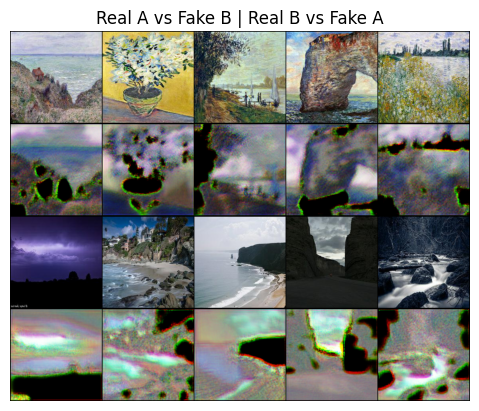

[Epoch 1/5] [Batch 50/250] [D loss : 0.292535] [G loss : 5.208252 - (adv : 0.447023, cycle : 0.322512, identity : 0.307221)]


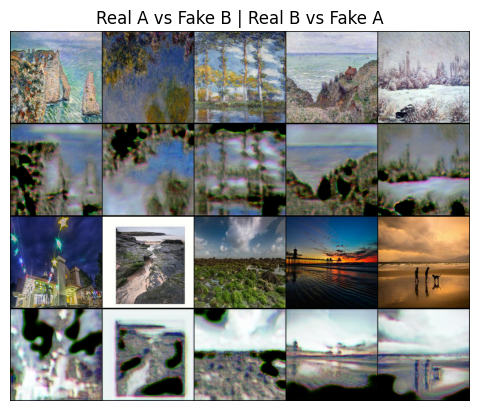

[Epoch 1/5] [Batch 100/250] [D loss : 0.352200] [G loss : 4.791660 - (adv : 0.347068, cycle : 0.301288, identity : 0.286341)]


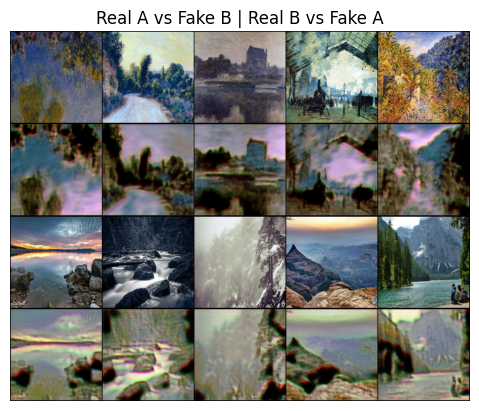

[Epoch 1/5] [Batch 150/250] [D loss : 0.293495] [G loss : 6.718142 - (adv : 0.335027, cycle : 0.415306, identity : 0.446012)]


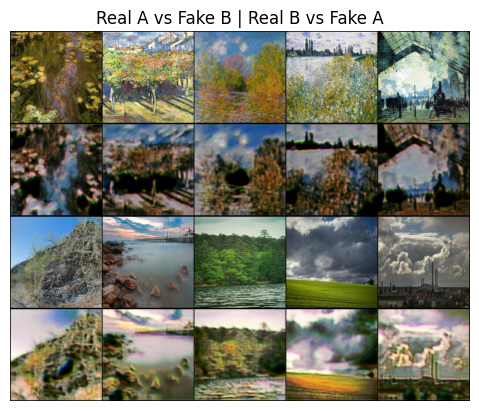

[Epoch 1/5] [Batch 200/250] [D loss : 0.309929] [G loss : 3.744749 - (adv : 0.232786, cycle : 0.249836, identity : 0.202721)]


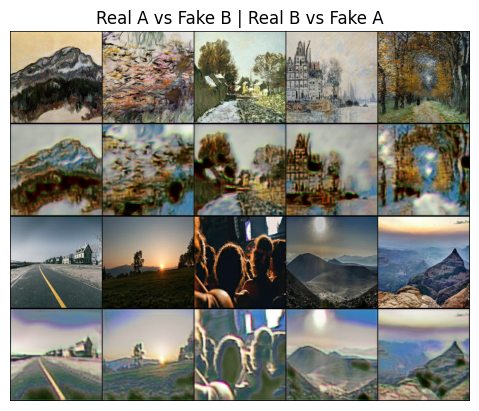

[Epoch 1/5] [Batch 250/250] [D loss : 0.254345] [G loss : 6.286225 - (adv : 0.398438, cycle : 0.400535, identity : 0.376488)]


  0%|          | 0/250 [00:00<?, ?it/s]

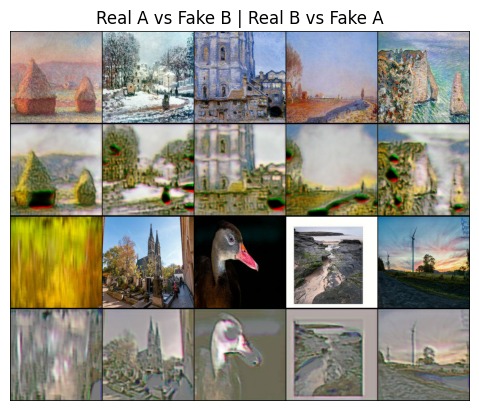

[Epoch 2/5] [Batch 50/250] [D loss : 0.211092] [G loss : 4.077906 - (adv : 0.407512, cycle : 0.254359, identity : 0.225361)]


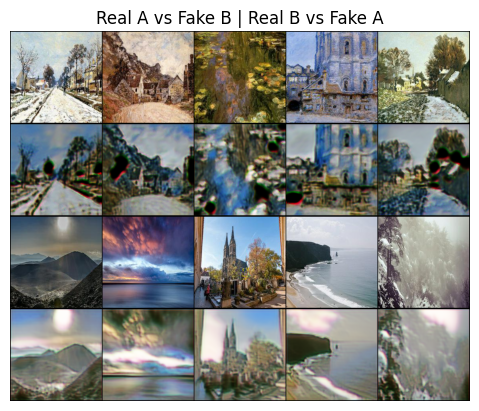

[Epoch 2/5] [Batch 100/250] [D loss : 0.130146] [G loss : 4.845662 - (adv : 0.581213, cycle : 0.287892, identity : 0.277105)]


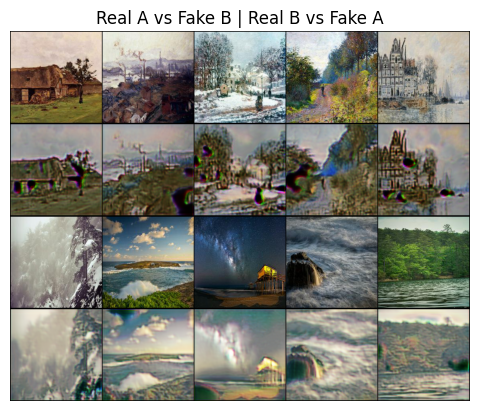

[Epoch 2/5] [Batch 150/250] [D loss : 0.237164] [G loss : 5.900174 - (adv : 0.442328, cycle : 0.368143, identity : 0.355282)]


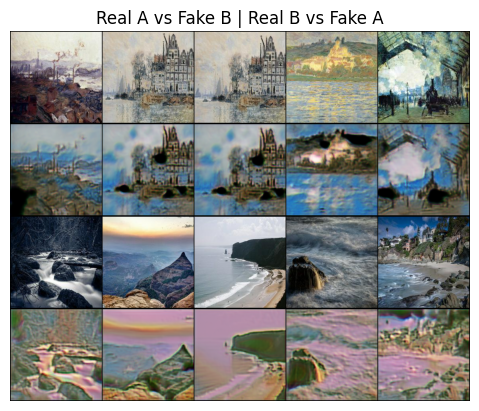

[Epoch 2/5] [Batch 200/250] [D loss : 0.314425] [G loss : 3.800176 - (adv : 0.474295, cycle : 0.229129, identity : 0.206919)]


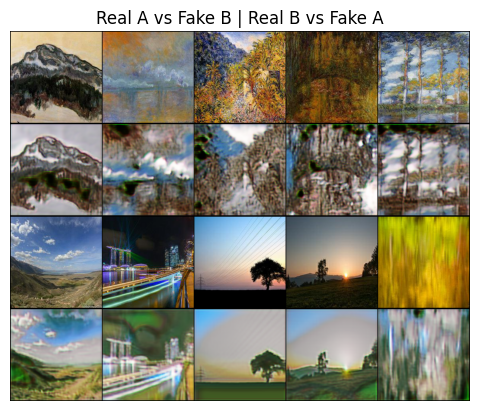

[Epoch 2/5] [Batch 250/250] [D loss : 0.359768] [G loss : 4.130516 - (adv : 0.382412, cycle : 0.258862, identity : 0.231898)]


  0%|          | 0/250 [00:00<?, ?it/s]

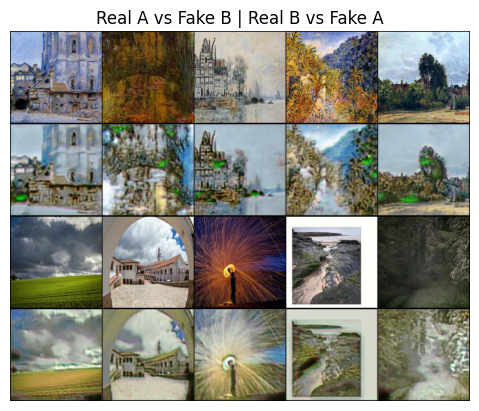

[Epoch 3/5] [Batch 50/250] [D loss : 0.329846] [G loss : 4.727314 - (adv : 0.362142, cycle : 0.303494, identity : 0.266046)]


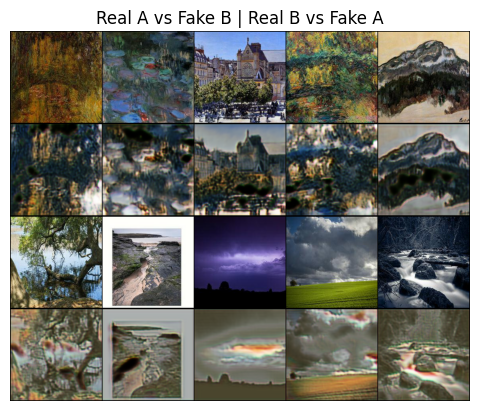

[Epoch 3/5] [Batch 100/250] [D loss : 0.151931] [G loss : 3.848084 - (adv : 0.595460, cycle : 0.224723, identity : 0.201078)]


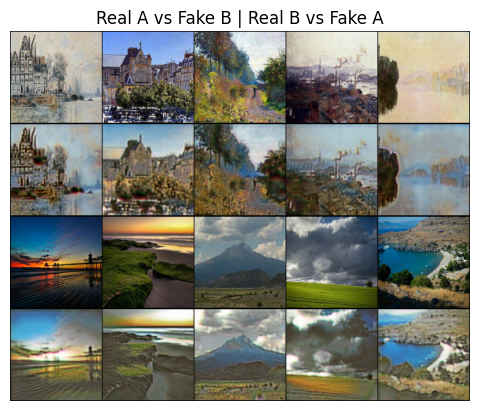

[Epoch 3/5] [Batch 150/250] [D loss : 0.249910] [G loss : 3.580656 - (adv : 0.277066, cycle : 0.224860, identity : 0.210997)]


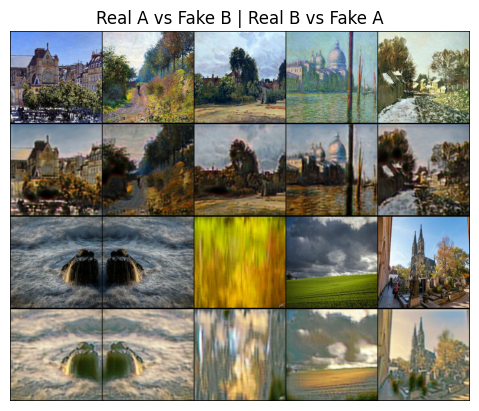

[Epoch 3/5] [Batch 200/250] [D loss : 0.348523] [G loss : 4.292973 - (adv : 0.473987, cycle : 0.257657, identity : 0.248484)]


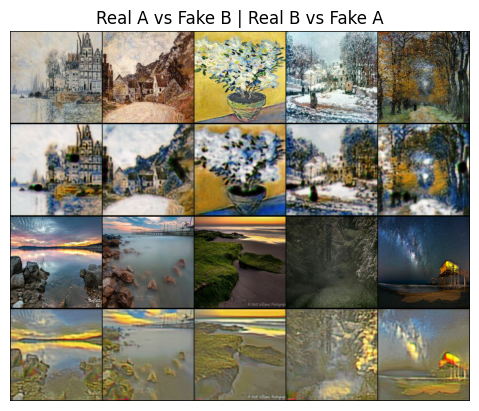

[Epoch 3/5] [Batch 250/250] [D loss : 0.383793] [G loss : 4.111580 - (adv : 0.385980, cycle : 0.275202, identity : 0.194716)]


  0%|          | 0/250 [00:00<?, ?it/s]

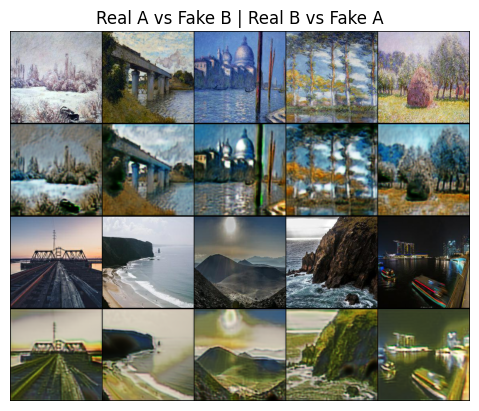

[Epoch 4/5] [Batch 50/250] [D loss : 0.241053] [G loss : 3.158331 - (adv : 0.330018, cycle : 0.199103, identity : 0.167457)]


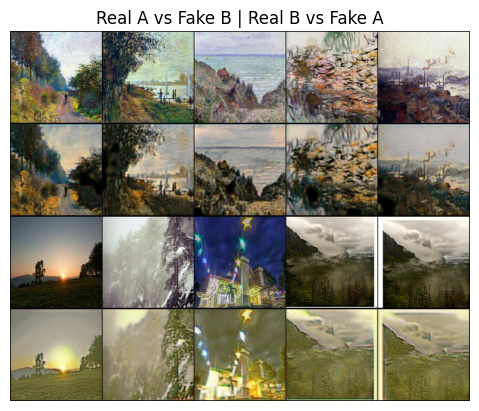

[Epoch 4/5] [Batch 100/250] [D loss : 0.213299] [G loss : 8.033178 - (adv : 0.263999, cycle : 0.518535, identity : 0.516766)]


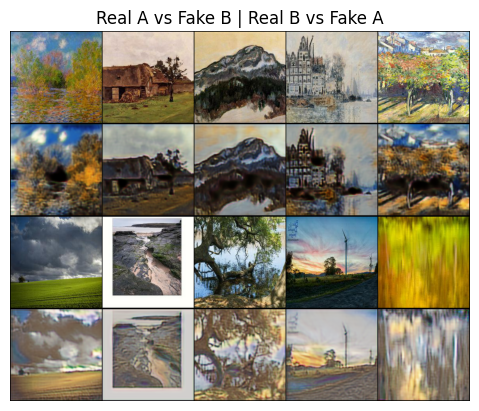

[Epoch 4/5] [Batch 150/250] [D loss : 0.362052] [G loss : 3.963753 - (adv : 0.547016, cycle : 0.230019, identity : 0.223310)]


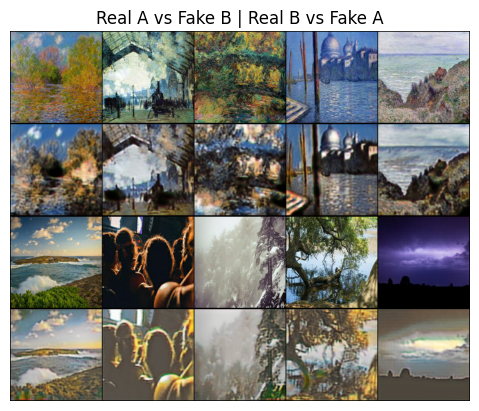

[Epoch 4/5] [Batch 200/250] [D loss : 0.199043] [G loss : 3.580543 - (adv : 0.586804, cycle : 0.205418, identity : 0.187912)]


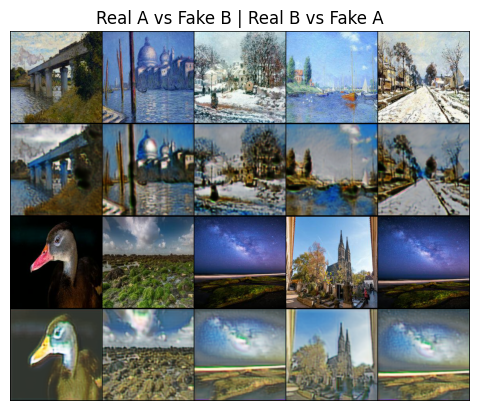

[Epoch 4/5] [Batch 250/250] [D loss : 0.188909] [G loss : 4.026978 - (adv : 0.582022, cycle : 0.255092, identity : 0.178806)]


  0%|          | 0/250 [00:00<?, ?it/s]

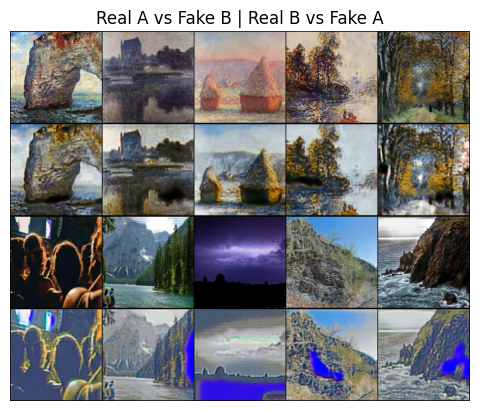

[Epoch 5/5] [Batch 50/250] [D loss : 0.191571] [G loss : 3.171340 - (adv : 0.347995, cycle : 0.207107, identity : 0.150455)]


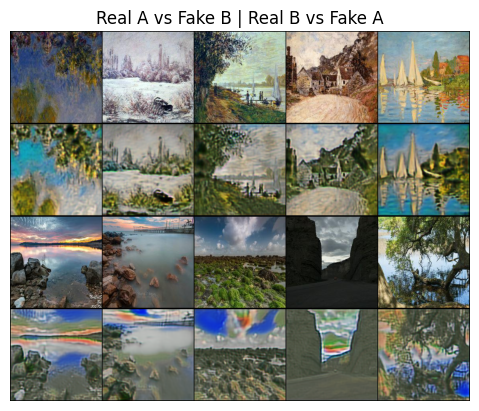

[Epoch 5/5] [Batch 100/250] [D loss : 0.328059] [G loss : 4.990772 - (adv : 0.572658, cycle : 0.309320, identity : 0.264982)]


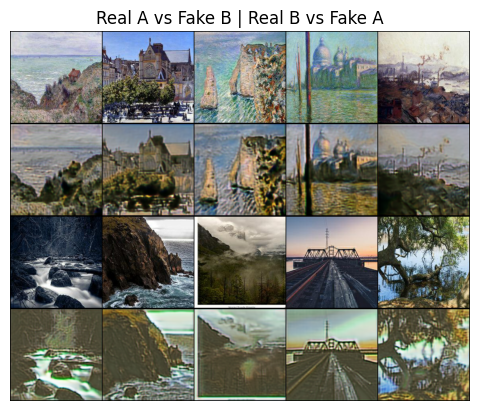

[Epoch 5/5] [Batch 150/250] [D loss : 0.270936] [G loss : 5.444264 - (adv : 0.501838, cycle : 0.362157, identity : 0.264172)]


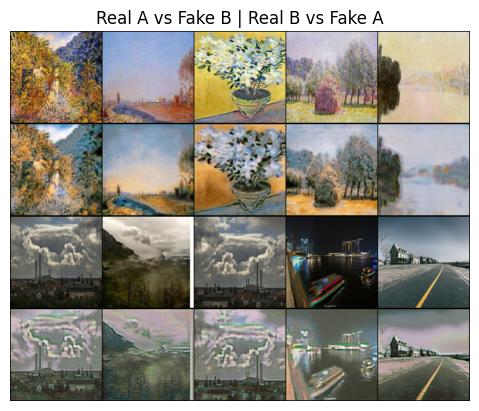

[Epoch 5/5] [Batch 200/250] [D loss : 0.301282] [G loss : 4.513299 - (adv : 0.201738, cycle : 0.295160, identity : 0.271993)]


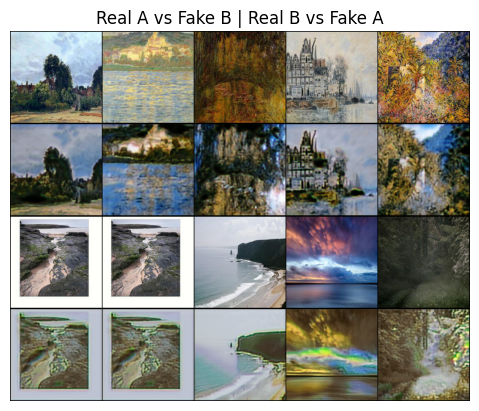

[Epoch 5/5] [Batch 250/250] [D loss : 0.141832] [G loss : 2.997400 - (adv : 0.633723, cycle : 0.158100, identity : 0.156535)]


In [29]:
for epoch in range(epoch,n_epochs):
  for i, batch in enumerate(tqdm(dataloader)):
    real_A = batch['A'].type(Tensor)
    real_B = batch['B'].type(Tensor)

    valid = Tensor(np.ones((real_A.size(0), *D_A.output_shape)))
    fake = Tensor(np.zeros((real_A.size(0), *D_A.output_shape)))

# Train Generators
    G_AB.train()
    G_BA.train()

    optimizer_G.zero_grad()
    #identity loss
    loss_id_A = criterion_identity(G_BA(real_A),real_A)
    loss_id_B = criterion_identity(G_AB(real_B),real_B)

    loss_identity = (loss_id_A + loss_id_B)/2

    #GAN loss
    fake_B = G_AB(real_A)
    loss_GAN_AB = criterion_GAN(D_B(fake_B),valid)
    fake_A = G_BA(real_B)
    loss_GAN_BA = criterion_GAN(D_A(fake_A),valid)

    loss_GAN = (loss_GAN_AB + loss_GAN_BA)/2

    #cycle loss
    recov_A = G_BA(fake_B)
    loss_cycle_A = criterion_cycle(recov_A, real_A)

    recov_B = G_AB(fake_A)
    loss_cycle_B = criterion_cycle(recov_B, real_B)

    loss_cycle = (loss_cycle_A + loss_cycle_B)/2

    #total loss
    loss_G = loss_GAN + (10.0*loss_cycle) + (5.0*loss_identity)

    loss_G.backward()
    optimizer_G.step()

# Train Discriminator A
    optimizer_D_A.zero_grad()

    loss_real = criterion_GAN(D_A(real_A), valid)
    loss_fake = criterion_GAN(D_A(fake_A.detach()), fake)

    loss_D_A = (loss_real + loss_fake)/2
    loss_D_A.backward()
    optimizer_D_A.step()

# Train Discriminator B
    optimizer_D_B.zero_grad()

    loss_real = criterion_GAN(D_B(real_B), valid)
    loss_fake = criterion_GAN(D_B(fake_B.detach()), fake)

    loss_D_B = (loss_real + loss_fake)/2
    loss_D_B.backward()
    optimizer_D_B.step()

    # Total Loss

    loss_D = (loss_D_A + loss_D_B)/2

    if(i+1) % 50 == 0:
      sample_images()
      print('[Epoch %d/%d] [Batch %d/%d] [D loss : %f] [G loss : %f - (adv : %f, cycle : %f, identity : %f)]'
                    %(epoch+1,n_epochs,       # [Epoch -]
                      i+1,len(dataloader),   # [Batch -]
                      loss_D.item(),       # [D loss -]
                      loss_G.item(),       # [G loss -]
                      loss_GAN.item(),     # [adv -]
                      loss_cycle.item(),   # [cycle -]
                      loss_identity.item(),# [identity -]
                     ))

In [30]:
import torch
Path = "/content/drive/MyDrive/CV Data/Monet-to-Photo"
checkpoint = {
                        "epoch": n_epochs,
                        "GAB_state": G_AB.state_dict(),
                        "optim_state": optimizer_G.state_dict(),
                        }
torch.save(checkpoint, os.path.join(Path,f'Checkpoint_G_AB_{n_epochs}.pth'))

checkpoint = {
                        "epoch": n_epochs,
                        "GBA_state": G_BA.state_dict(),
                        "optim_state": optimizer_G.state_dict(),
                        }
torch.save(checkpoint, os.path.join(Path,f'Checkpoint_G_BA_{n_epochs}.pth'))

In [31]:
import torch
Path = "/content/drive/MyDrive/CV Data/Monet-to-Photo"
checkpoint = {
                        "epoch": n_epochs,
                        "GAB_state": G_AB.state_dict(),
                        "optim_state": optimizer_G.state_dict(),
                        }
torch.save(checkpoint, os.path.join(Path,f'Checkpoint_G_AB_{n_epochs}.pth'))

checkpoint = {
                        "epoch": n_epochs,
                        "GBA_state": G_BA.state_dict(),
                        "optim_state": optimizer_G.state_dict(),
                        }
torch.save(checkpoint, os.path.join(Path,f'Checkpoint_G_BA_{n_epochs}.pth'))

In [44]:
# G_BA_test = G_BA
# checkpoint = torch.load('/content/drive/MyDrive/CV Data/Monet-to-Photo/Checkpoint_G_BA_5.pth')
# G_BA_test.load_state_dict(checkpoint['GBA_state'])

In [70]:
transform = transforms.Compose([
    transforms.ToTensor()

])

In [71]:
G_BA.eval()
img = Image.open("/content/Lex_Fridman_teaching_at_MIT_in_2018.png")
img_tensor = transform(img).type(Tensor)
fake_A = G_BA(img_tensor).detach()
img_tensor.shape

torch.Size([3, 699, 574])

In [74]:
transform = transforms.Resize((699,574))
fake_A = transform(fake_A)

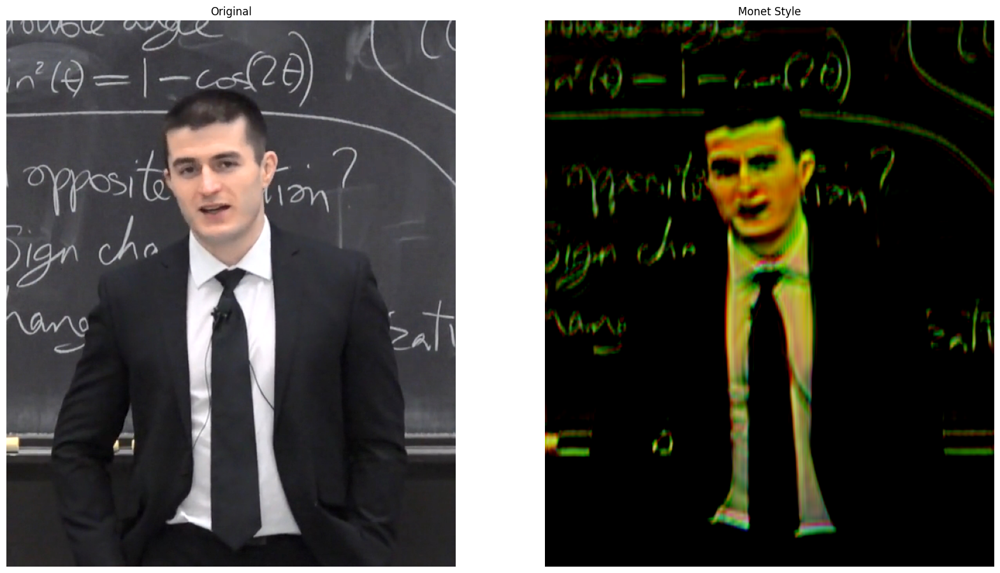

In [75]:
fig, axs = plt.subplots(1,2, figsize=(20, 20))
axs[1].imshow(fake_A.cpu().permute(1,2,0))
axs[1].set_title("Monet Style")
axs[1].axis("off")
axs[0].imshow(img_tensor.cpu().permute(1,2,0))
axs[0].set_title("Original")
axs[0].axis("off")
plt.show()